In [1]:
import sys


In [2]:
import time
import os

import scanpy as sc
import numpy as np
import scipy.sparse as sp

import torch
from torch import optim


import gae.gae.optimizer as optimizer
import gae.gae.model
import gae.gae.preprocessing as preprocessing

import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import pandas as pd
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler
import json
import matplotlib.image as mpimg
import networkx as nx

from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import euclidean_distances
import mnnpy

/home/xinyi/anaconda3/envs/pytorch3/lib/python3.10/site-packages/mnnpy/utils.py:30: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, A), array(float32, 1d, A))
  dist[i, j] = np.dot(m[i], n[j])
/home/xinyi/anaconda3/envs/pytorch3/lib/python3.10/site-packages/mnnpy/utils.py:205: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, C), array(float32, 1d, A))
  scale = np.dot(working, grad)
/home/xinyi/anaconda3/envs/pytorch3/lib/python3.10/site-packages/mnnpy/utils.py:215: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (array(float32, 1d, C), array(float32, 1d, A))
  curproj = np.dot(grad, curcell)


Cython module _utils not initialized. Fallback to python.


In [3]:
datadir='/home/xinyi/staci_validation/10xVisiumADFFPE/'
tissuepospath='VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggr_tissue_positions_list.csv'
tissuepos=pd.read_csv(os.path.join(datadir,tissuepospath),header=None)

tissuepos.index=tissuepos.iloc[:,0]
libraryID=pd.read_csv(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggregation.csv'))
features=sc.read_10x_h5(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_filtered_feature_bc_matrix.h5'))

/home/xinyi/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
features.obs['x']=tissuepos.loc[features.obs.index,4]
features.obs['y']=tissuepos.loc[features.obs.index,5]
features.obs['barcodes']=features.obs.index
sampleidx=features.obs['barcodes'].apply(lambda x: x.split('-')[1])
samplenameList=np.zeros(sampleidx.size).astype(str)
for s in np.unique(sampleidx):
    samplenameList[sampleidx==s]=libraryID['library_id'][int(s)-1]
features.obs['samplename']=samplenameList
features.var_names_make_unique()
features=features[:,np.array(np.sum(features.X,axis=0)>3).flatten()]

In [5]:
# Settings
# os.environ["CUDA_VISIBLE_DEVICES"] = "2" 
cudadevice0=0
cudadevice1=1
use_cuda=True
fastmode=False #Validate during training pass
seed=3
useSavedMaskedEdges=True
maskedgeName='knn6_connectivity'
nneighbors=6
epochs=13240
saveFreq=490
lr=0.0001 #initial learning rate; used 0.01 for mnn; 0.001 for combat exploded at 4rd epoch
weight_decay=0 #Weight for L2 loss on embedding matrix.

hidden1=32 #Number of units in hidden layer 1
hidden2=32 #Number of units in hidden layer 2
fc_dim1=32

dropout=0.01
testNodes=0.1 #fraction of total nodes for testing
valNodes=0.05 #fraction of total nodes for validation
XreconWeight=240
model_str='gcn_vae_xa_e2_d1_dca_sharded'
adj_decodeName=None #gala or None
ridgeL=0.01
shareGenePi=True

training_sample_X='combat' #choice of 'logminmax' (default for STACI), 'mnn' (normalization procedure in the scanpy tutorial followed by MNN for batch correction), and 'combat' (batch correction using the combat function in scanpy)
switchFreq=10
standardizeX=False
name='10xAD_01_dca_over_combat' 
useA=True #set to True to incorporate adjacency reconstruction loss
logsavepath='/data/xinyi/log/train_gae_visium_validation/'+name
modelsavepath='/data/xinyi/models/train_gae_visium_validation/'+name
plotsavepath='/data/xinyi/plots/train_gae_visium_validation/'+name

if not os.path.exists(logsavepath):
    os.mkdir(logsavepath)
if not os.path.exists(modelsavepath):
    os.mkdir(modelsavepath)
if not os.path.exists(plotsavepath):
    os.mkdir(plotsavepath)


# Set cuda and seed
np.random.seed(seed)
if use_cuda and (not torch.cuda.is_available()):
    print('cuda not available')
    use_cuda=False
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.enabled = True


In [6]:
def getA_knn(samplename,k,a_mode,savepath=None):
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(sobj_coord_np)
    a=nbrs.kneighbors_graph(sobj_coord_np,mode=a_mode)
    if a_mode=='connectivity':
        a=a-sp.identity(sobj_coord_np.shape[0],format='csr')
    if a_mode=='distance':
        a[a!=0]=1/a[a!=0]
    if savepath !=None:
        sp.save_npz(savepath,a)
    return a

In [7]:
def plotA(coord,adj):
    g=nx.from_numpy_matrix(adj)
    pos={}
    for n in range(coord.shape[0]):
        pos[n]=(coord[n][0],coord[n][1])
    fig, ax = plt.subplots(dpi=400)
    nx.draw(g,pos,node_size=1,width=0.1)
    plt.savefig(os.path.join(plotsavepath,samplename+'_connectedA'))
    plt.show()

In [8]:
savedirlist={}
featureslist={}
features_raw_list={}
adj_list={}
coordlist={}
commonGenes=[]
    
    
if training_sample_X=='logminmax':
    for samplename in np.unique(features.obs['samplename']):
        print(samplename)
    
        featurelog_train=np.log2(features.X[features.obs['samplename']==samplename].toarray()+1/2)
        scaler = MinMaxScaler()
        featurelog_train_minmax=np.transpose(scaler.fit_transform(np.transpose(featurelog_train)))
        featureslist[samplename+'X_'+training_sample_X]=torch.tensor(featurelog_train_minmax)
elif training_sample_X=='mnn':
    feature_corrected=features.copy()
    sc.pp.normalize_total(feature_corrected, target_sum=1e4)
    sc.pp.log1p(feature_corrected)
    sc.pp.highly_variable_genes(feature_corrected,batch_key='samplename')
    featureslist_correct={}
    for b in np.unique(feature_corrected.obs['samplename']):
        featureslist_correct[b]=feature_corrected[feature_corrected.obs['samplename']==b]
    featureslist_correct=sc.external.pp.mnn_correct(featureslist_correct['Transgenic_17p9_rep1'],
                                            featureslist_correct['Transgenic_17p9_rep2'],
                                            featureslist_correct['Transgenic_2p5_rep1'],
                                            featureslist_correct['Transgenic_2p5_rep2'],
                                            featureslist_correct['Transgenic_5p7_rep1'],
                                            featureslist_correct['Transgenic_5p7_rep2'],
                                            featureslist_correct['Wildtype_13p4_rep1'],
                                            featureslist_correct['Wildtype_13p4_rep2'],
                                            featureslist_correct['Wildtype_2p5_rep1'],
                                            featureslist_correct['Wildtype_2p5_rep2'],
                                            featureslist_correct['Wildtype_5p7_rep1'],
                                            featureslist_correct['Wildtype_5p7_rep2'],batch_key='samplename',var_subset=feature_corrected.var.index[feature_corrected.var.highly_variable],do_concatenate=False)
    for b in range(len(featureslist_correct[0])):
        samplename=featureslist_correct[0][b].obs['samplename'][0]
        featureslist[samplename+'X_'+training_sample_X]=torch.tensor(featureslist_correct[0][b].X.toarray())
elif training_sample_X=='combat':
    feature_corrected=features.copy()
    sc.pp.normalize_total(feature_corrected, target_sum=1e4)
    sc.pp.log1p(feature_corrected)
    sc.pp.scale(feature_corrected)
    sc.pp.combat(feature_corrected,key='samplename')
    for b in np.unique(features.obs['samplename']):
        featureslist[b+'X_'+training_sample_X]=torch.tensor(feature_corrected[feature_corrected.obs['samplename']==b].X.toarray())
for samplename in np.unique(features.obs['samplename']):
    print(samplename)    
    adj_list[samplename]=getA_knn(samplename,nneighbors+1,'connectivity')
    features_raw_list[samplename+'X_'+'raw']=torch.tensor(features.X[features.obs['samplename']==samplename].toarray())
    
    
num_features=features.shape[1]
print(num_features)
adjnormlist={}
pos_weightlist={}
normlist={}
for ai in adj_list.keys():
    adjnormlist[ai]=preprocessing.preprocess_graph(adj_list[ai])
    
    pos_weightlist[ai] = torch.tensor(float(adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) / adj_list[ai].sum()) #using full unmasked adj
    normlist[ai] = adj_list[ai].shape[0] * adj_list[ai].shape[0] / float((adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) * 2)
    
    adj_label=adj_list[ai] + sp.eye(adj_list[ai].shape[0])
    adj_list[ai]=torch.tensor(adj_label.toarray())
    
        

/home/xinyi/.local/lib/python3.8/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in true_divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max()


Transgenic_17p9_rep1
Transgenic_17p9_rep2
Transgenic_2p5_rep1
Transgenic_2p5_rep2
Transgenic_5p7_rep1
Transgenic_5p7_rep2
Wildtype_13p4_rep1
Wildtype_13p4_rep2
Wildtype_2p5_rep1
Wildtype_2p5_rep2
Wildtype_5p7_rep1
Wildtype_5p7_rep2
17186
0
0
0
0
0
0
0
0
0
0
0
0


Transgenic_17p9_rep1


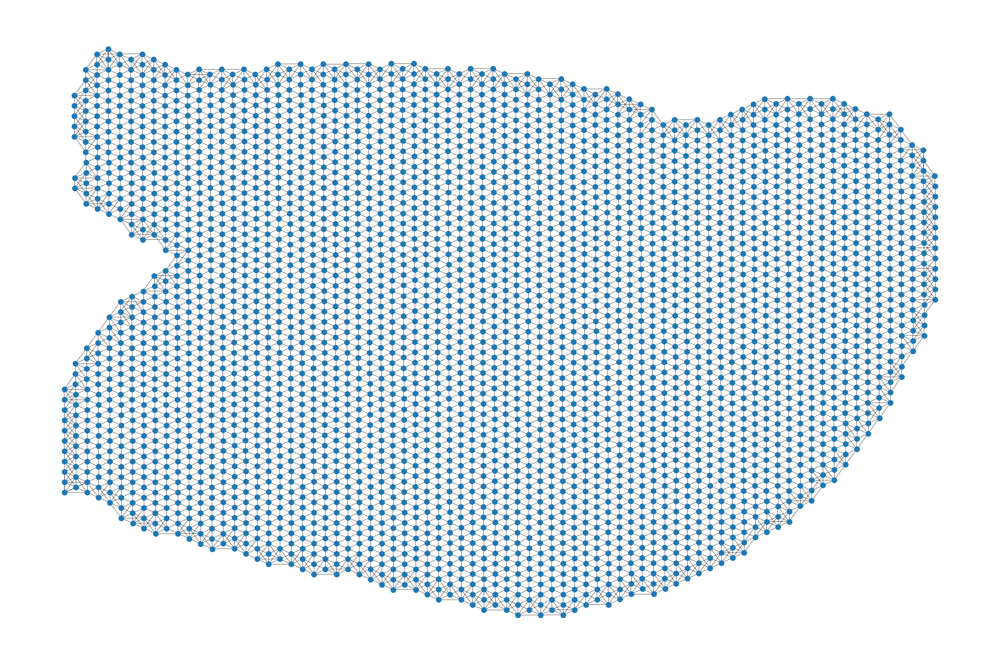

Transgenic_17p9_rep2


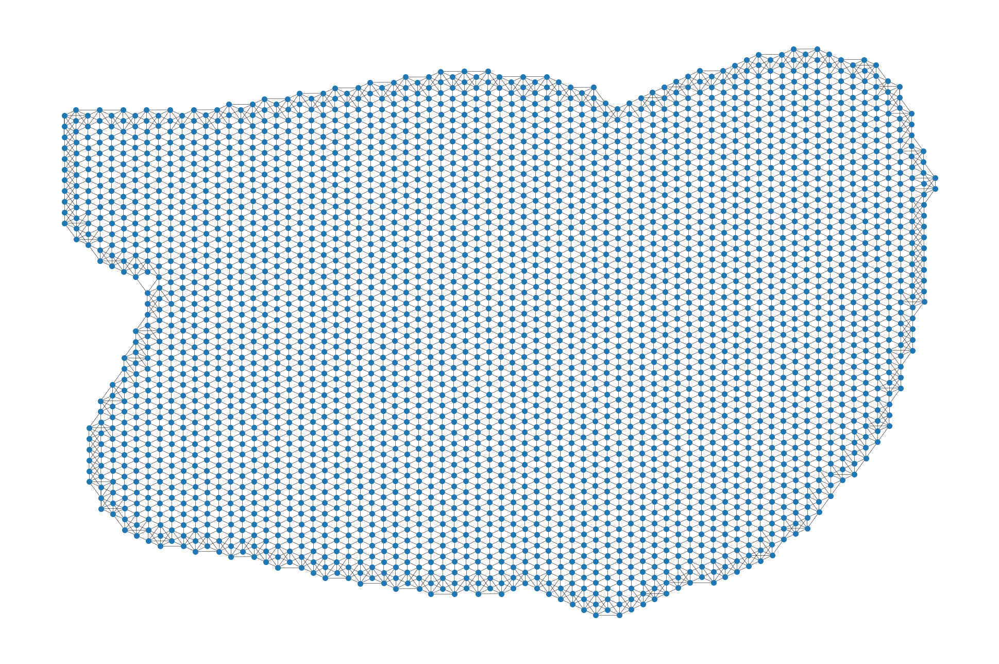

Transgenic_2p5_rep1


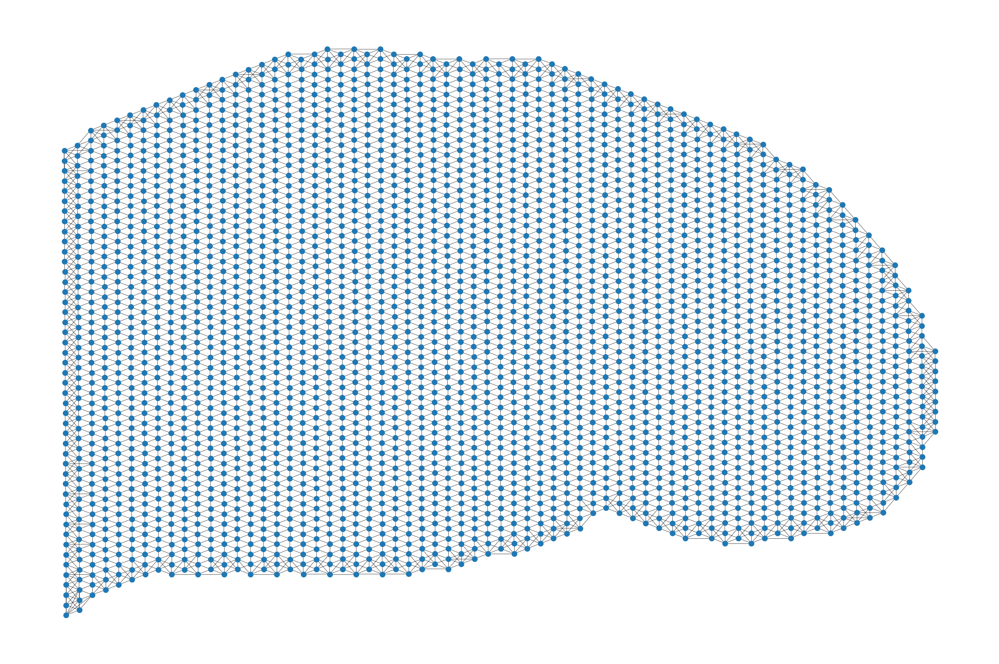

Transgenic_2p5_rep2


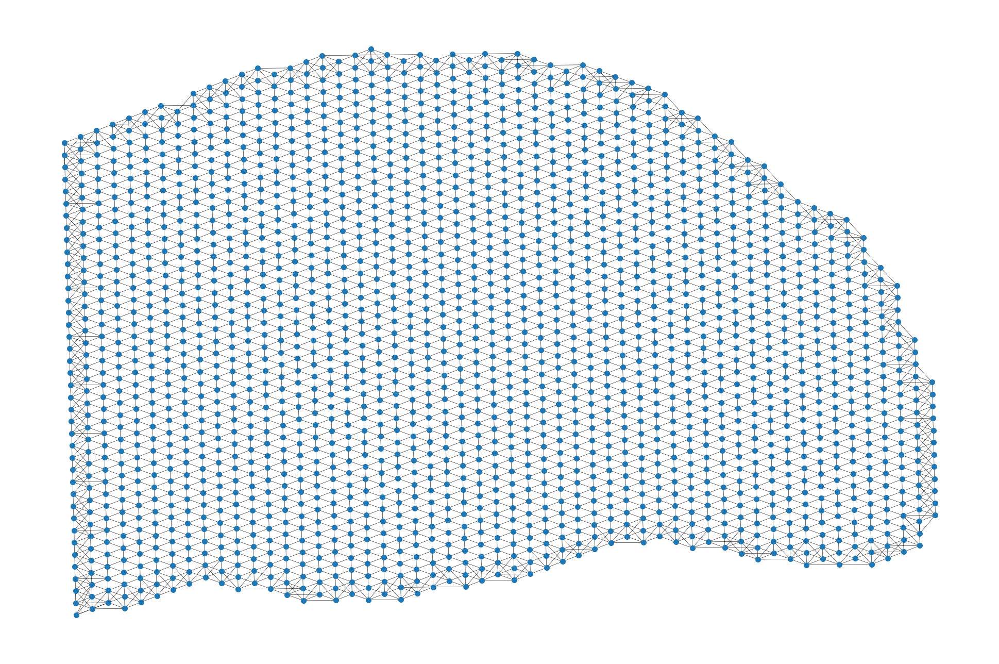

Transgenic_5p7_rep1


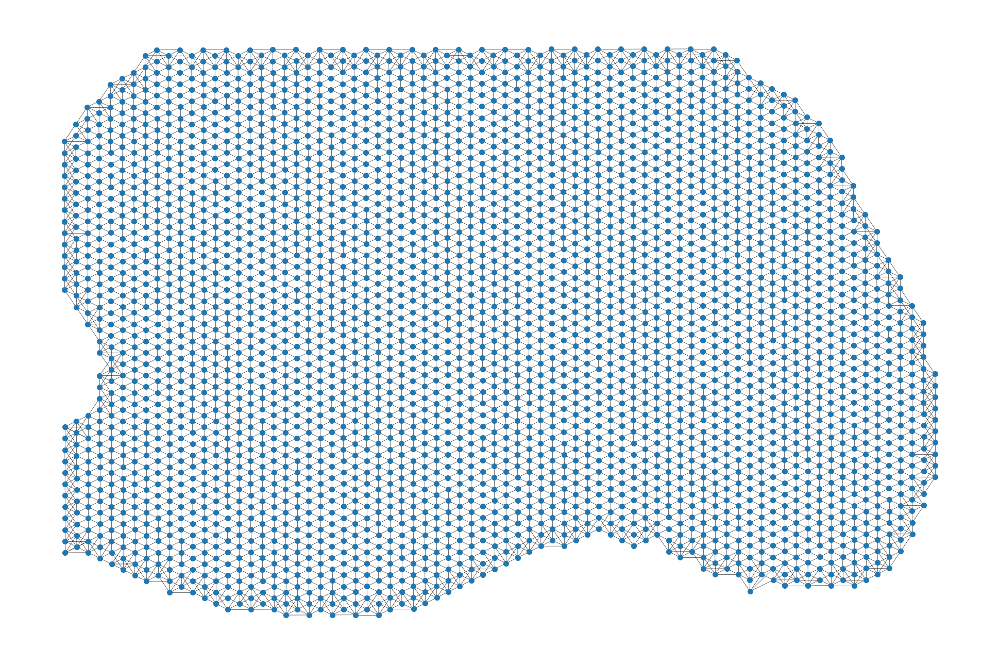

Transgenic_5p7_rep2


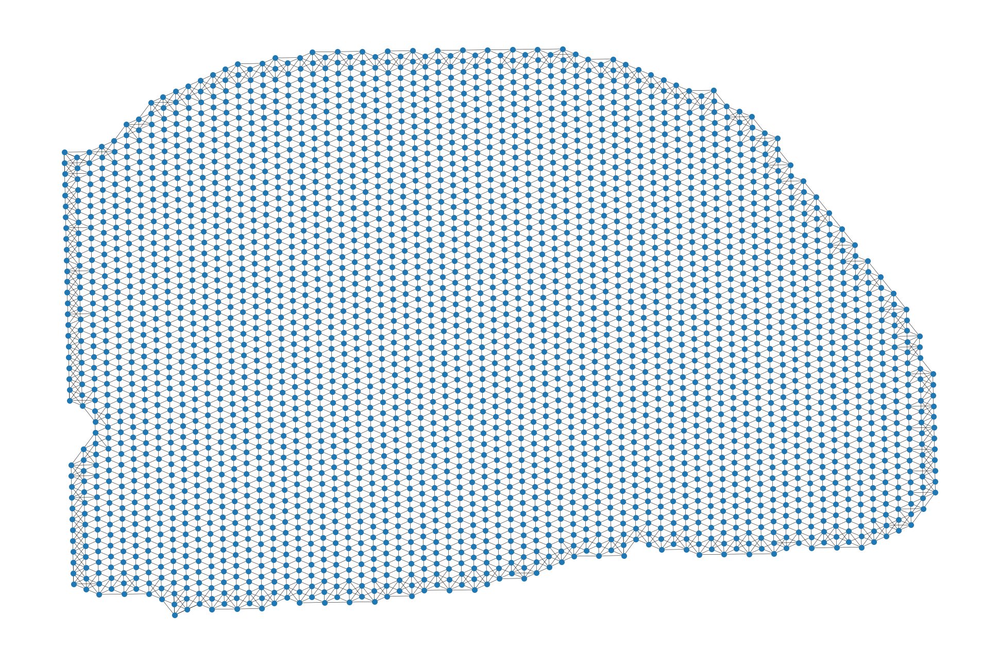

Wildtype_13p4_rep1


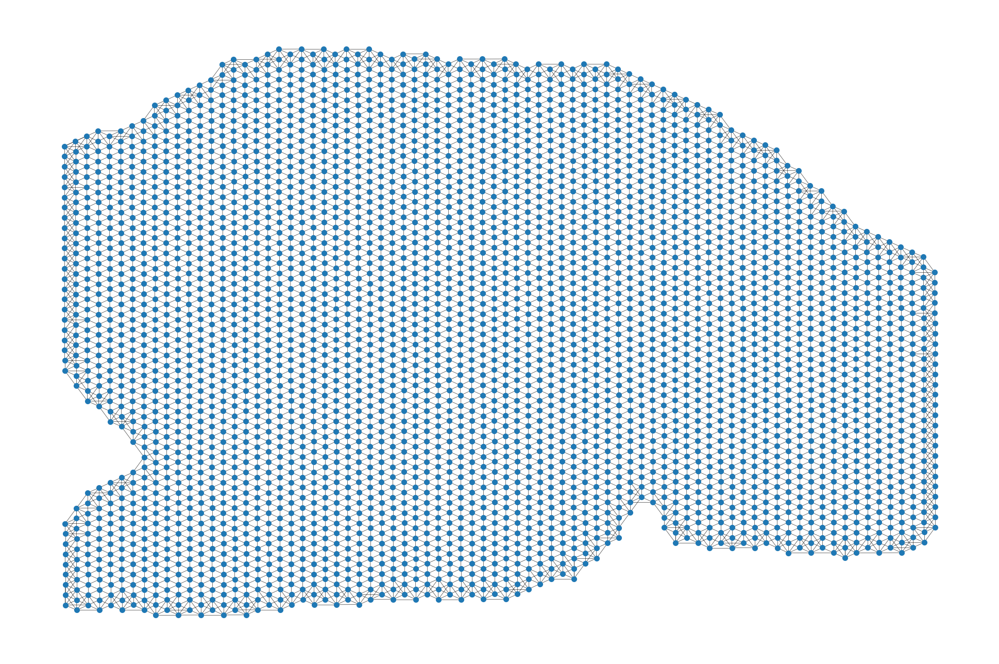

Wildtype_13p4_rep2


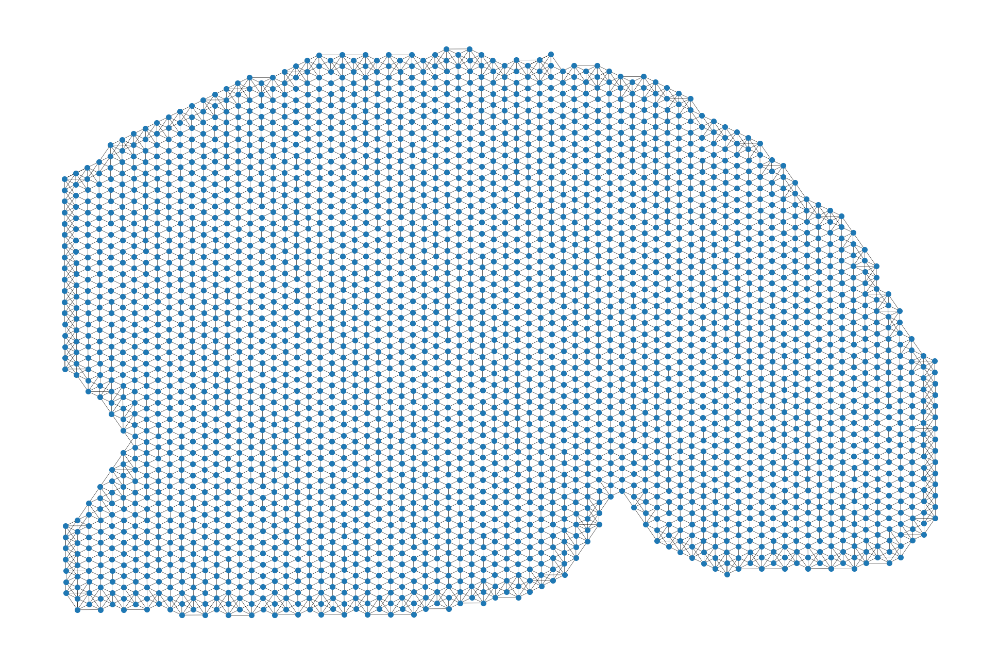

Wildtype_2p5_rep1


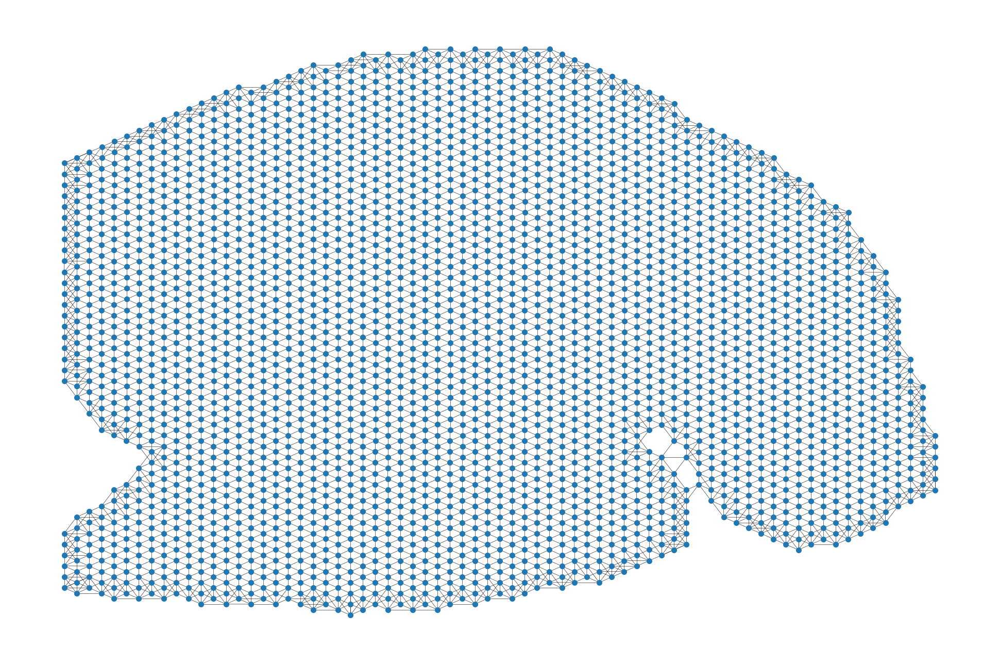

Wildtype_2p5_rep2


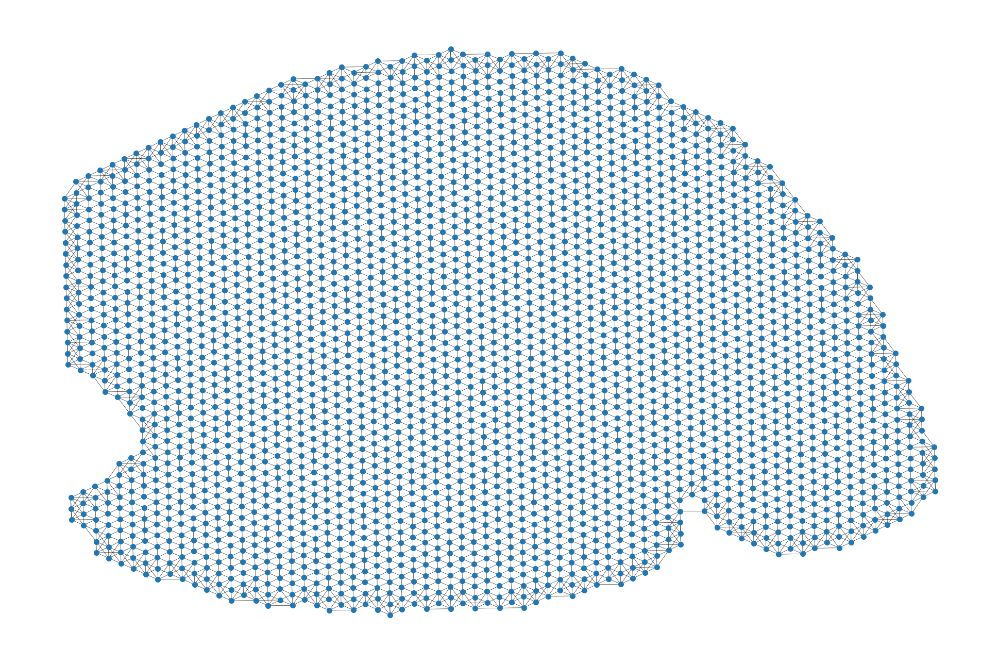

Wildtype_5p7_rep1


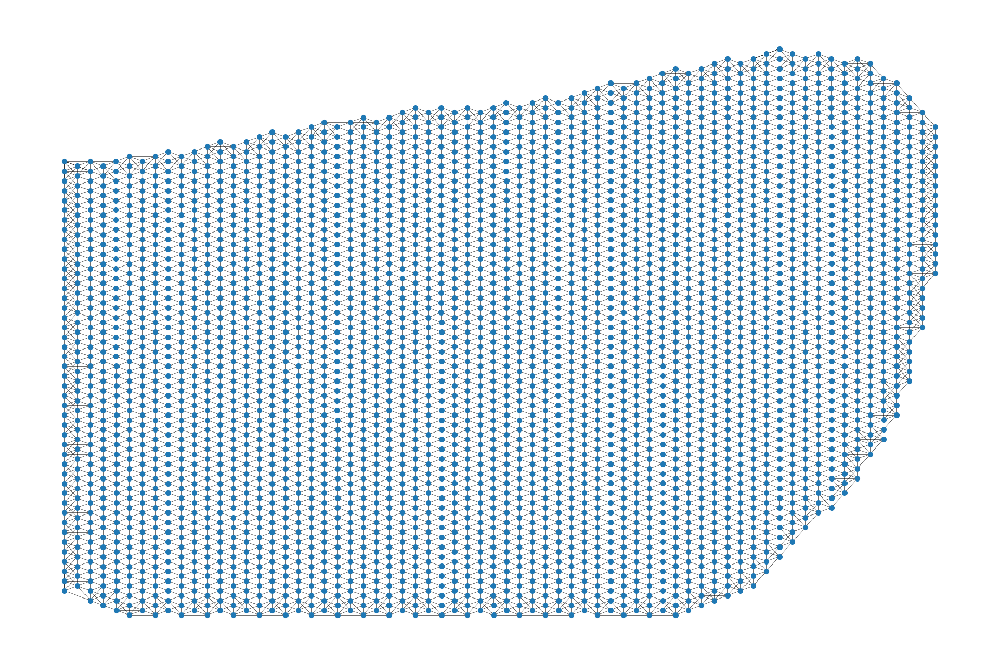

Wildtype_5p7_rep2


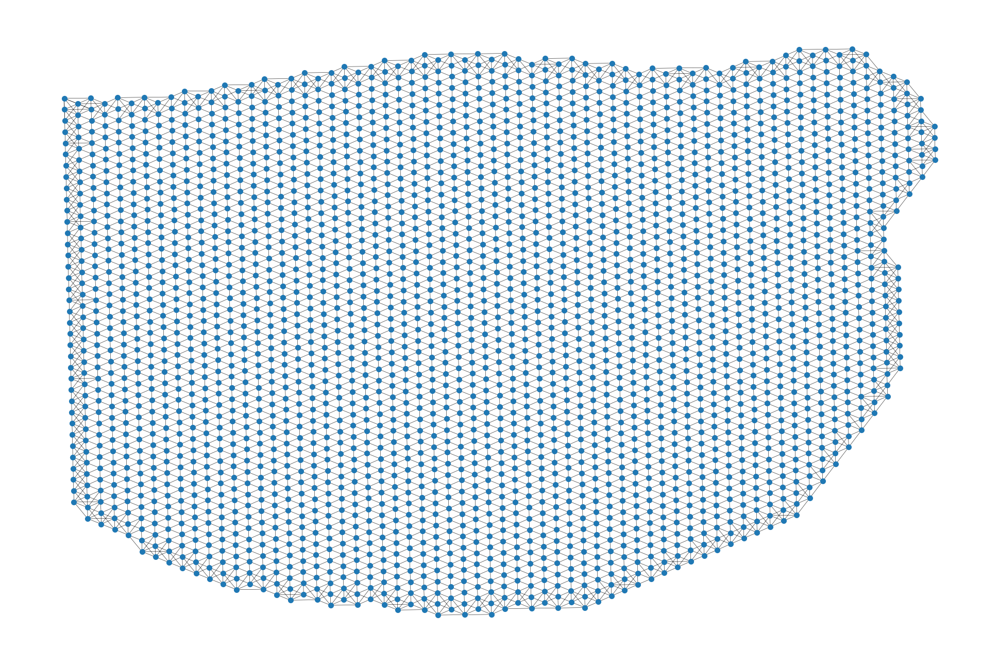

In [9]:
for samplename in adj_list.keys():
    print(samplename)
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    plotA(sobj_coord_np,adj_list[samplename].numpy()-sp.eye(sobj_coord_np.shape[0]))



In [10]:
# loop over all train/validation sets

mse=torch.nn.MSELoss()
# mse=torch.nn.MSELoss(reduction=None)
# Create model
if model_str=='gcn_vae_xa':
    model = gae.gae.model.GCNModelVAE_XA(num_features, hidden1, hidden2,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
elif model_str == 'gcn_vae_gcnX_inprA':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_gcnX_inprA_w':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA_w(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='gcn_vae_xa_e3':
    model = gae.gae.model.GCNModelVAE_XA_e3(num_features, hidden1, hidden2,hidden3,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_xa_e1':
    model = gae.gae.model.GCNModelVAE_XA_e1(num_features, hidden1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE

elif model_str == 'gcn_vae_xa_e2_d1':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1(num_features, hidden1,hidden2, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_sharded':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_sharded(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_fca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_fca(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaFork':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAfork(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaElemPi':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAelemPi(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaConstantDisp':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_constantDisp(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE    
    
elif model_str == 'gcn_vae_xa_e4_d1':
    model = gae.gae.model.GCNModelVAE_XA_e4_d1(num_features, hidden1,hidden2,hidden3,hidden4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='fc':
    model = gae.gae.model.FCVAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
    loss_a=optimizer.optimizer_CE
elif model_str=='fcae':
    model = gae.gae.model.FCAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse

elif model_str=='fcae1':
    model = gae.gae.model.FCAE1(num_features, dropout,hidden1)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
elif model_str=='fcae2':
    model = gae.gae.model.FCAE2(num_features, dropout,hidden1,hidden2)
    loss_x=optimizer.optimizer_MSE

elif model_str=='fc1':
    model = gae.gae.model.FCVAE1(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

elif model_str=='fc1_fca':
    model = gae.gae.model.FCVAE1_fca(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca':
    model = gae.gae.model.FCVAE1_DCA(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca_sharded':
    model = gae.gae.model.FCVAE1_DCA_sharded(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

if clf=='clf_fc1':
    modelClf=gae.gae.model.Clf_fc1(hidden2, dropout,clf_hidden,ct_unique.size)
    loss_clf=torch.nn.CrossEntropyLoss()
    
if adv=='clf_fc1' or adv=='clf_fc1_eq' or adv=='clf_fc1_control' or adv=='clf_fc1_control_eq':
    modelAdv=gae.gae.model.Clf_fc1(hidden2, dropout,adv_hidden,sampleLabellist_ae['control13'].size()[1])
    loss_adv=optimizer.optimizer_CEclf
    


optimizerVAEXA = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
if clf:
    optimizerClf=optim.Adam(modelClf.parameters(), lr=lr, weight_decay=weight_decay)
if adv:
    optimizerAdv=optim.Adam(modelAdv.parameters(), lr=lr_adv, weight_decay=weight_decay)    


In [ ]:
def train(epoch):
    t = time.time()
    model.train()
    optimizerVAEXA.zero_grad(True)
    
    if adj_decodeName==None:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm)
    #     features_recon, z, mu, logvar=model(features.float())
    else:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm,adj_decode)
        
    adj_recon=adj_recon.cuda(0)
    mu=mu.cuda(0)
    logvar=logvar.cuda(0)
    z=z.cuda(0)
#     features_recon=features_recon.cuda(0)
    
    if clf:
        modelClf.train()
        optimizerClf.zero_grad()
        clfOut=modelClf(z)
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        modelAdv.eval()
        advOut=modelAdv(z)
    
    loss_kl_train=loss_kl(mu, logvar, train_nodes_idx)
    if 'dca' in model_str:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,mse)
    loss_a_train=loss_a(adj_recon, adj_label, pos_weight, norm,train_nodes_idx)
    loss=loss_kl_train+loss_x_train 
    if useA:
        loss=loss+loss_a_train
    loss.backward()
    optimizerVAEXA.step()
        
    with torch.no_grad():
        if not fastmode:
            # Evaluate validation set performance separately,
            # deactivates dropout during validation run & no variation in z.
            model.eval()
            if adj_decodeName==None:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
        #         features_recon, z, mu, logvar=model(features.float())
            else:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)

        adj_recon=adj_recon.cuda(0)
        mu=mu.cuda(0)
        logvar=logvar.cuda(0)
        z=z.cuda(0)
    #     features_recon=features_recon.cuda(0)

        if clf:
            modelClf.eval()
            clfOut=modelClf(z)
        if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
            advOut=modelAdv(z)
        if 'dca' in model_str:
            loss_x_val=loss_x(features_recon, features.cuda(0),val_nodes_idx,XreconWeight,ridgeL,features_raw)
        else:
            loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight,mse)
        loss_a_val=loss_a(adj_recon, adj_label, pos_weight, norm,val_nodes_idx)
        loss_val=loss_x_val
        if useA:
            loss_val=loss_val+loss_a_val
    print(training_samples_t+' Epoch: {:04d}'.format(epoch),
#           'loss_train: {:.4f}'.format(loss.item()),
          'loss_kl_train: {:.4f}'.format(loss_kl_train.item()),
          'loss_x_train: {:.4f}'.format(loss_x_train.item()),
          'loss_a_train: {:.4f}'.format(loss_a_train.item()),
#           'loss_clf_train: {:.4f}'.format(loss_clf_train.item()),
#           'loss_val: {:.4f}'.format(loss_val.item()),
          'loss_x_val: {:.4f}'.format(loss_x_val.item()),
          'loss_a_val: {:.4f}'.format(loss_a_val.item()),
#           'loss_clf_val: {:.4f}'.format(loss_clf_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    return time.time() - t,float(loss),float(loss_kl_train),float(loss_x_train),float(loss_a_train),float(loss_val),float(loss_x_val),float(loss_a_val)        

    
train_loss_ep=[None]*epochs
train_loss_kl_ep=[None]*epochs
train_loss_x_ep=[None]*epochs
train_loss_a_ep=[None]*epochs
val_loss_ep=[None]*epochs
val_loss_x_ep=[None]*epochs
val_loss_a_ep=[None]*epochs

timePerEpoch=[None]*epochs

t_ep=time.time()

for ep in range(epochs):
    t=int(ep/switchFreq)%np.unique(samplenameList).size
    training_samples_t=np.unique(samplenameList)[t]
    print(training_samples_t)

    adj_norm=adjnormlist[training_samples_t]
    features=featureslist[training_samples_t+'X_'+training_sample_X].float()
    adj_label=adj_list[training_samples_t].cuda(0).float()
    pos_weight=pos_weightlist[training_samples_t]
    norm=normlist[training_samples_t]
    if 'dca' in model_str:
        features_raw=features_raw_list[training_samples_t+'X_raw'].cuda()
    num_nodes,_ = features.shape

    maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes)
    train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
    if use_cuda:
        train_nodes_idx=train_nodes_idx.cuda(0)
        val_nodes_idx=val_nodes_idx.cuda(0)
        test_nodes_idx=test_nodes_idx.cuda(0)

    with torch.profiler.record_function("train_and_validate"):
        timePerEpoch[ep],train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep]=train(ep)


    if ep%saveFreq == 0 and ep!=0:
        torch.save(model.state_dict(), os.path.join(modelsavepath,str(ep)+'.pt'))



Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0000 loss_kl_train: 0.0015 loss_x_train: 199.4380 loss_a_train: 3.7728 loss_x_val: 194.5902 loss_a_val: 1.0914 time: 2.2612s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0001 loss_kl_train: 0.0015 loss_x_train: 199.4448 loss_a_train: 3.7702 loss_x_val: nan loss_a_val: nan time: 0.3161s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0002 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2990s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0003 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.3032s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0004 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.3016s
Transgenic_17p9_rep1
Transgenic_17p9_rep1 Epoch: 0005 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.3030s
Transgenic_17p9_rep1
Transgenic_17p9_rep

Transgenic_5p7_rep2 Epoch: 0053 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2705s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0054 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2711s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0055 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2713s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0056 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2707s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0057 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2715s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0058 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2715s
Transgenic_5p7_rep2
Transgenic_5p7_rep2 Epoch: 0059 loss_kl_train: nan loss_x_train: nan loss_a_train:

Wildtype_5p7_rep1 Epoch: 0108 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.3023s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0109 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2883s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 0110 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2480s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 0111 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2557s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 0112 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2505s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 0113 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2536s
Wildtype_5p7_rep2
Wildtype_5p7_rep2 Epoch: 0114 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_

Transgenic_5p7_rep1 Epoch: 0162 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2937s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0163 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2850s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0164 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2861s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0165 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2891s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0166 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2816s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0167 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2889s
Transgenic_5p7_rep1
Transgenic_5p7_rep1 Epoch: 0168 loss_kl_train: nan loss_x_train: nan loss_a_train:

Wildtype_2p5_rep2 Epoch: 0217 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2575s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 0218 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2562s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 0219 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2570s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0220 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2972s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0221 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2973s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0222 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2990s
Wildtype_5p7_rep1
Wildtype_5p7_rep1 Epoch: 0223 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_

Transgenic_2p5_rep2 Epoch: 0271 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1854s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0272 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1827s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0273 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1845s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0274 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1834s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0275 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1852s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0276 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.1830s
Transgenic_2p5_rep2
Transgenic_2p5_rep2 Epoch: 0277 loss_kl_train: nan loss_x_train: nan loss_a_train:

Wildtype_2p5_rep1 Epoch: 0325 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2650s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0326 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2642s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0327 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2642s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0328 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2639s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0329 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2630s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 0330 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2574s
Wildtype_2p5_rep2
Wildtype_2p5_rep2 Epoch: 0331 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_

Transgenic_2p5_rep1 Epoch: 0380 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2610s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0381 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2601s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0382 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2601s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0383 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2592s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0384 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2567s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0385 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2566s
Transgenic_2p5_rep1
Transgenic_2p5_rep1 Epoch: 0386 loss_kl_train: nan loss_x_train: nan loss_a_train:

Wildtype_13p4_rep2 Epoch: 0434 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2798s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 0435 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2784s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 0436 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2810s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 0437 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2813s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 0438 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2811s
Wildtype_13p4_rep2
Wildtype_13p4_rep2 Epoch: 0439 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2853s
Wildtype_2p5_rep1
Wildtype_2p5_rep1 Epoch: 0440 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val

Transgenic_17p9_rep1 Epoch: 0489 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.3011s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0490 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2862s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0491 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2784s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0492 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2816s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0493 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2802s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0494 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2807s
Transgenic_17p9_rep2
Transgenic_17p9_rep2 Epoch: 0495 loss_kl_train: nan loss_x_train: nan 

Wildtype_13p4_rep1 Epoch: 0543 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2930s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0544 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2893s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0545 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2875s
Wildtype_13p4_rep1
Wildtype_13p4_rep1 Epoch: 0546 loss_kl_train: nan loss_x_train: nan loss_a_train: nan loss_x_val: nan loss_a_val: nan time: 0.2934s
Wildtype_13p4_rep1


In [ ]:
with open(os.path.join(logsavepath,'train_loss'), 'wb') as output:
    pickle.dump(train_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_kl'), 'wb') as output:
    pickle.dump(train_loss_kl_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_x'), 'wb') as output:
    pickle.dump(train_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_a'), 'wb') as output:
    pickle.dump(train_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss'), 'wb') as output:
    pickle.dump(val_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_x'), 'wb') as output:
    pickle.dump(val_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_a'), 'wb') as output:
    pickle.dump(val_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'time'), 'wb') as output:
    pickle.dump(timePerEpoch, output, pickle.HIGHEST_PROTOCOL)


In [ ]:
plt.plot(np.arange(epochs),train_loss_x_ep)
plt.plot(np.arange(epochs),val_loss_x_ep)
plt.plot(np.arange(epochs),train_loss_a_ep)
plt.plot(np.arange(epochs),val_loss_a_ep)
plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath,'loss_seed3.jpg'))
plt.show()
